In [ ]:
!gdown 1KUYTg4uRbaxJ8B0yxWXEa-YIRnki4jIu

Downloading...
From: https://drive.google.com/uc?id=1KUYTg4uRbaxJ8B0yxWXEa-YIRnki4jIu
To: /content/monogatari_white.zip
100% 167M/167M [00:00<00:00, 256MB/s]


In [ ]:
!unzip monogatari_white.zip

Archive:  monogatari_white.zip
   creating: monogatari_white/
  inflating: monogatari_white/meta.json  
   creating: monogatari_white/train/
  inflating: monogatari_white/train/1047694.jpg  
  inflating: monogatari_white/train/1076078.jpg  
  inflating: monogatari_white/train/1076582.jpg  
  inflating: monogatari_white/train/1081293.jpg  
  inflating: monogatari_white/train/1083519.jpg  
  inflating: monogatari_white/train/1093038.jpg  
  inflating: monogatari_white/train/1093223.jpg  
  inflating: monogatari_white/train/1093232.jpg  
  inflating: monogatari_white/train/1096214.jpg  
  inflating: monogatari_white/train/1097160.jpg  
  inflating: monogatari_white/train/1097741.jpg  
  inflating: monogatari_white/train/1108229.jpg  
  inflating: monogatari_white/train/1116929.jpg  
  inflating: monogatari_white/train/1118482.jpg  
  inflating: monogatari_white/train/1119390.jpg  
  inflating: monogatari_white/train/1125882.jpg  
  inflating: monogatari_white/train/1126156.jpg  
  inflati

In [ ]:
!gdown 1jtiXrSIp8CAJhoZqMcySwW8-biK_Sz1-

Downloading...
From: https://drive.google.com/uc?id=1jtiXrSIp8CAJhoZqMcySwW8-biK_Sz1-
To: /content/corgi_pembroke_flickr.zip
100% 39.3M/39.3M [00:01<00:00, 26.3MB/s]


In [ ]:
!unzip corgi_pembroke_flickr.zip

Archive:  corgi_pembroke_flickr.zip
  inflating: corgi_pembroke_flickr/10256870736.jpg  
  inflating: corgi_pembroke_flickr/10256952746.jpg  
  inflating: corgi_pembroke_flickr/10391636265.jpg  
  inflating: corgi_pembroke_flickr/10581621353.jpg  
  inflating: corgi_pembroke_flickr/10600282855.jpg  
  inflating: corgi_pembroke_flickr/10616939733.jpg  
  inflating: corgi_pembroke_flickr/10634905984.jpg  
  inflating: corgi_pembroke_flickr/106987380.jpg  
  inflating: corgi_pembroke_flickr/10844922235.jpg  
  inflating: corgi_pembroke_flickr/10861804464.jpg  
  inflating: corgi_pembroke_flickr/10913380916.jpg  
  inflating: corgi_pembroke_flickr/10968758785.jpg  
  inflating: corgi_pembroke_flickr/11057271533.jpg  
  inflating: corgi_pembroke_flickr/11091738354.jpg  
  inflating: corgi_pembroke_flickr/11161250716.jpg  
  inflating: corgi_pembroke_flickr/11179572646.jpg  
  inflating: corgi_pembroke_flickr/11213687105.jpg  
  inflating: corgi_pembroke_flickr/11280107923.jpg  
  inflating:

In [ ]:
# for train/test split of corgi dataset
# from pathlib import Path
# dir = Path("")
# dir = dir/"corgi_pembroke_flickr"
# file_names = [dir/o.name for o in dir.iterdir()]

In [ ]:
# find_labels = 0
# i=0
# for name in file_names:
#   if str(name)[-1] == 'n':
#     print(name)
#     print(i)
#     find_labels=i
#   i+=1

corgi_pembroke_flickr/meta.json
478
corgi_pembroke_flickr/train
722


In [ ]:
# files = file_names[:find_labels] + file_names[find_labels+1:]

In [ ]:
# import numpy as np
# np.random.shuffle(files)
# k = len(files)-60
# train_files = files[:k]
# test_files = files[k:]

In [ ]:
# import os
# train_path = 'corgi_pembroke_flickr/train'
# if not os.path.exists(train_path):
#     os.makedirs(train_path)

In [ ]:
# test_path = 'corgi_pembroke_flickr/test'
# if not os.path.exists(test_path):
#     os.makedirs(test_path)

In [ ]:
# import shutil
# for file in train_files:
#     shutil.move(file, train_path)
# for file in test_files:
#     shutil.move(file, test_path)

In [ ]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import collections  as mc
%matplotlib inline

import random

import torch
import torch.nn as nn

import torchvision.datasets as datasets
from torchvision import transforms

from IPython.display import clear_output
from tqdm.notebook import tqdm as tqdm

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

In [ ]:
T_ITERS = 10
IMG_SIZE = 128

BATCH_SIZE = 64

PLOT_INTERVAL = 20
SAVE_CHECKPOINTS_INTERVAL = 400
COST = 'mse' # Mean Squared Error
CPKT_INTERVAL = 2000
MAX_STEPS = 1000
SEED = 0x000000

In [ ]:
torch.manual_seed(SEED); np.random.seed(SEED)

In [ ]:
from torchvision import transforms


def default_transform():
    return transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((IMG_SIZE, IMG_SIZE), antialias=True),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])


def default_input_post_transform():
    return transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((IMG_SIZE, IMG_SIZE), antialias=True),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])


def default_target_post_transform():
    return transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((IMG_SIZE, IMG_SIZE), antialias=True),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

In [ ]:
import os
import cv2
import numpy as np
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset

#from .transforms import default_input_post_transform, default_target_post_transform


class EdgesDataset(Dataset):
    """Edges dataset. Read images and apply transforms.

    Args:
        images_dir (str): path to images folder
        pre_transform (torchvision.transforms.transform):
            image transform before edge detection
        input_post_transform (torchvision.transforms.transform):
            input image transform after edge detection
        target_post_transform (torchvision.transforms.transform):
            target image transform after edge detection
        thresholds (tuple): Canny edge detection params

    """

    def __init__(
            self,
            images_dir,
            pre_transform = None,
            input_post_transform = None,
            target_post_transform = None,
            thresholds = (100, 200)
    ):
        self.images_dir = images_dir[:-1] if images_dir[-1] == "/" else images_dir
        self.pre_transform = transforms.Lambda(lambda x: x) if pre_transform is None else pre_transform
        self.input_post_transform = default_input_post_transform() if input_post_transform is None \
                                                                   else input_post_transform
        self.target_post_transform = default_target_post_transform() if target_post_transform is None \
                                                                     else target_post_transform
        self.thresholds = thresholds

        self.ids = [name for name in os.listdir(self.images_dir) if
                    name.lower().endswith('.png') or
                    name.lower().endswith('.jpg') or
                    name.lower().endswith('.jpeg') or
                    # name.lower().endswith('.gif') or
                    name.lower().endswith('.bmp')]
        self.ids.sort()

        self.ids = [self.images_dir + "/" + name for name in self.ids]

    def __getitem__(self, i):
        # Load image
        target = cv2.imread(self.ids[i])
        target = target[..., ::-1]
        # pair = cv2.cvtColor(pair, cv2.COLOR_BGR2GRAY)

        # Apply pre-transforms
        target = Image.fromarray(target, mode="RGB")
        target = self.pre_transform(target)

        # Extract edges
        input = cv2.Canny(np.asarray(target),
                          threshold1=self.thresholds[0],
                          threshold2=self.thresholds[1])
        input = 255 - input

        input = cv2.cvtColor(input, cv2.COLOR_GRAY2RGB)

        # Apply post-transforms
        input = self.input_post_transform(input)
        target = self.target_post_transform(target)

        return input, target

    def __len__(self):
        return len(self.ids)

In [ ]:
dataset_train = EdgesDataset("monogatari_white/train")
dataset_test = EdgesDataset("monogatari_white/valid")

In [ ]:
#for corgi dataset
# dataset_train = EdgesDataset("corgi_pembroke_flickr/train")
# dataset_test = EdgesDataset("corgi_pembroke_flickr/test")

In [ ]:
train_dataloader = torch.utils.data.DataLoader(dataset_train, batch_size=dataset_train.__len__(), shuffle=True)
test_dataloder = torch.utils.data.DataLoader(dataset_test, batch_size=dataset_test.__len__(), shuffle=True)

In [ ]:
X_train, Y_train = next(iter(train_dataloader))

In [ ]:
X_test, Y_test = next(iter(test_dataloder))

In [ ]:
class SimpleDataset(Dataset):
    def __init__(
            self,
            X,
            Y,
            device
    ):
      self.X = X.to(device)
      self.Y = Y.to(device)

    def __getitem__(self, i):
        input = self.X[i]
        target = self.Y[i]

        return input, target

    def __len__(self):
        return self.X.shape[0]

In [ ]:
# dataset_train = EdgesDataset("corgi_pembroke_flickr/train")
# dataset_test = EdgesDataset("corgi_pembroke_flickr/test")

In [ ]:
new_train = SimpleDataset(X_train, Y_train, DEVICE)
new_test = SimpleDataset(X_test, Y_test, DEVICE)

In [ ]:
train_dataloader = torch.utils.data.DataLoader(new_train, batch_size=BATCH_SIZE, shuffle=True)
test_dataloder = torch.utils.data.DataLoader(new_test, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
torch.manual_seed(0xBADBEEF); np.random.seed(0xBADBEEF)
# We only a few samples from them for the qualitative analysis
X_test_fixed, Y_test_fixed = next(iter(test_dataloder))

Random (unpaired) images from MNIST (1st row) and USPS (2nd row) train sets


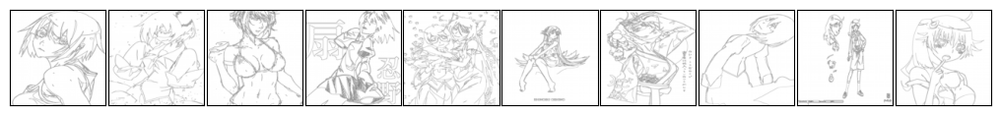

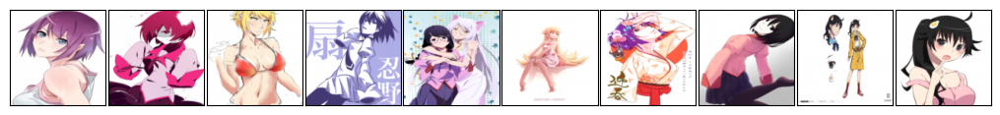

In [ ]:
def plot_images(batch):
    fig, axes = plt.subplots(1, 10, figsize=(10, 1), dpi=100)
    for i in range(10):
        axes[i].imshow(batch[i].cpu().mul(0.5).add(0.5).clip(0,1).permute(1,2,0))
        axes[i].set_xticks([]); axes[i].set_yticks([])
    fig.tight_layout(pad=0.1)

print('Random (unpaired) images from MNIST (1st row) and USPS (2nd row) train sets')
plot_images(X_test_fixed)
plot_images(Y_test_fixed)

In [ ]:
def freeze(model):
    for p in model.parameters():
        p.requires_grad_(False)
    model.eval()

def unfreeze(model):
    for p in model.parameters():
        p.requires_grad_(True)
    model.train(True)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import functools

class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels , in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)


    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = torch.tensor([x2.size()[2] - x1.size()[2]])
        diffX = torch.tensor([x2.size()[3] - x1.size()[3]])

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        # if you have padding issues, see
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, base_factor=32, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear
        self.base_factor = base_factor

        self.inc = DoubleConv(n_channels, base_factor)
        self.down1 = Down(base_factor, 2 * base_factor)
        self.down2 = Down(2 * base_factor, 4 * base_factor)
        self.down3 = Down(4 * base_factor, 8 * base_factor)
        factor = 2 if bilinear else 1
        self.down4 = Down(8 * base_factor, 16 * base_factor // factor)
        self.up1 = Up(16 * base_factor, 8 * base_factor // factor, bilinear)
        self.up2 = Up(8 * base_factor, 4 * base_factor // factor, bilinear)
        self.up3 = Up(4 * base_factor, 2 * base_factor // factor, bilinear)
        self.up4 = Up(2 * base_factor, base_factor, bilinear)
        self.outc = OutConv(base_factor, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

In [ ]:
import numpy as np
import torch
from torch import nn

class ResNet_G(nn.Module):
    "Generator ResNet architecture from https://github.com/harryliew/WGAN-QC"
    def __init__(self, z_dim, size, nc=3, nfilter=64, nfilter_max=512, bn=True, res_ratio=0.1, **kwargs):
        super().__init__()
        s0 = self.s0 = 4
        nf = self.nf = nfilter
        nf_max = self.nf_max = nfilter_max
        self.bn = bn
        self.z_dim = z_dim
        self.nc = nc

        # Submodules
        nlayers = int(np.log2(size / s0))
        self.nf0 = min(nf_max, nf * 2**(nlayers+1))

        self.fc = nn.Linear(z_dim, self.nf0*s0*s0)
        if self.bn:
            self.bn1d = nn.BatchNorm1d(self.nf0*s0*s0)
        self.relu = nn.LeakyReLU(0.2, inplace=True)

        blocks = []
        for i in range(nlayers, 0, -1):
            nf0 = min(nf * 2**(i+1), nf_max)
            nf1 = min(nf * 2**i, nf_max)
            blocks += [
                ResNetBlock(nf0, nf1, bn=self.bn, res_ratio=res_ratio),
                ResNetBlock(nf1, nf1, bn=self.bn, res_ratio=res_ratio),
                nn.Upsample(scale_factor=2)
            ]

        nf0 = min(nf * 2, nf_max)
        nf1 = min(nf, nf_max)
        blocks += [
            ResNetBlock(nf0, nf1, bn=self.bn, res_ratio=res_ratio),
            ResNetBlock(nf1, nf1, bn=self.bn, res_ratio=res_ratio)
        ]

        self.resnet = nn.Sequential(*blocks)
        self.conv_img = nn.Conv2d(nf, nc, 3, padding=1)

    def forward(self, z):
        batch_size = z.size(0)
        z = z.view(batch_size, -1)
        out = self.fc(z)
        if self.bn:
            out = self.bn1d(out)
        out = self.relu(out)
        out = out.view(batch_size, self.nf0, self.s0, self.s0)

        out = self.resnet(out)

        out = self.conv_img(out)
        out = torch.tanh(out)

        return out


class ResNet_D(nn.Module):
    "Discriminator ResNet architecture from https://github.com/harryliew/WGAN-QC"
    def __init__(self, size=64, nc=3, nfilter=64, nfilter_max=512, res_ratio=0.1):
        super().__init__()
        s0 = self.s0 = 4
        nf = self.nf = nfilter
        nf_max = self.nf_max = nfilter_max
        self.nc = nc

        # Submodules
        nlayers = int(np.log2(size / s0))
        self.nf0 = min(nf_max, nf * 2**nlayers)

        nf0 = min(nf, nf_max)
        nf1 = min(nf * 2, nf_max)
        blocks = [
            ResNetBlock(nf0, nf0, bn=False, res_ratio=res_ratio),
            ResNetBlock(nf0, nf1, bn=False, res_ratio=res_ratio)
        ]

        for i in range(1, nlayers+1):
            nf0 = min(nf * 2**i, nf_max)
            nf1 = min(nf * 2**(i+1), nf_max)
            blocks += [
                nn.AvgPool2d(3, stride=2, padding=1),
                ResNetBlock(nf0, nf0, bn=False, res_ratio=res_ratio),
                ResNetBlock(nf0, nf1, bn=False, res_ratio=res_ratio),
            ]

        self.conv_img = nn.Conv2d(nc, 1*nf, 3, padding=1)
        self.relu = nn.LeakyReLU(0.2, inplace=True)
        self.resnet = nn.Sequential(*blocks)
        self.fc = nn.Linear(self.nf0*s0*s0, 1)

    def forward(self, x):
        batch_size = x.size(0)

        out = self.relu((self.conv_img(x)))
        out = self.resnet(out)
        out = out.view(batch_size, self.nf0*self.s0*self.s0)
        out = self.fc(out)

        return out


class ResNetBlock(nn.Module):
    def __init__(self, fin, fout, fhidden=None, bn=True, res_ratio=0.1):
        super().__init__()
        # Attributes
        self.bn = bn
        self.is_bias = not bn
        self.learned_shortcut = (fin != fout)
        self.fin = fin
        self.fout = fout
        if fhidden is None:
            self.fhidden = min(fin, fout)
        else:
            self.fhidden = fhidden
        self.res_ratio = res_ratio

        # Submodules
        self.conv_0 = nn.Conv2d(self.fin, self.fhidden, 3, stride=1, padding=1, bias=self.is_bias)
        if self.bn:
            self.bn2d_0 = nn.BatchNorm2d(self.fhidden)
        self.conv_1 = nn.Conv2d(self.fhidden, self.fout, 3, stride=1, padding=1, bias=self.is_bias)
        if self.bn:
            self.bn2d_1 = nn.BatchNorm2d(self.fout)
        if self.learned_shortcut:
            self.conv_s = nn.Conv2d(self.fin, self.fout, 1, stride=1, padding=0, bias=False)
            if self.bn:
                self.bn2d_s = nn.BatchNorm2d(self.fout)
        self.relu = nn.LeakyReLU(0.2, inplace=True)

    def forward(self, x):
        x_s = self._shortcut(x)
        dx = self.conv_0(x)
        if self.bn:
            dx = self.bn2d_0(dx)
        dx = self.relu(dx)
        dx = self.conv_1(dx)
        if self.bn:
            dx = self.bn2d_1(dx)
        out = self.relu(x_s + self.res_ratio*dx)
        return out

    def _shortcut(self, x):
        if self.learned_shortcut:
            x_s = self.conv_s(x)
            if self.bn:
                x_s = self.bn2d_s(x_s)
        else:
            x_s = x
        return x_s

In [ ]:
def weights_init_D(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='leaky_relu')
    elif classname.find('BatchNorm') != -1:
        nn.init.constant_(m.weight, 1)
        nn.init.constant_(m.bias, 0)

def fig2data ( fig ):
    """
    @brief Convert a Matplotlib figure to a 4D numpy array with RGBA channels and return it
    @param fig a matplotlib figure
    @return a numpy 3D array of RGBA values
    """
    # draw the renderer
    fig.canvas.draw ( )

    # Get the RGBA buffer from the figure
    w,h = fig.canvas.get_width_height()
    buf = np.fromstring ( fig.canvas.tostring_argb(), dtype=np.uint8 )
    buf.shape = ( w, h,4 )

    # canvas.tostring_argb give pixmap in ARGB mode. Roll the ALPHA channel to have it in RGBA mode
    buf = np.roll ( buf, 3, axis = 2 )
    return buf

def fig2img ( fig ):
    buf = fig2data ( fig )
    w, h, d = buf.shape
    return Image.frombytes( "RGBA", ( w ,h ), buf.tostring( ) )

def plot_images(X, Y, T):
    freeze(T);
    with torch.no_grad():
        T_X = T(X)
        #imgs = torch.cat([X, T_X, Y]).to('cpu').permute(0,2,3,1).mul(0.5).add(0.5).numpy().clip(0,1)
        imgs = []
        imgs.append(X.to('cpu'))
        imgs.append(T_X.to('cpu'))
        imgs.append(Y.to('cpu'))

    fig, axes = plt.subplots(3, 10, figsize=(15, 4.5), dpi=150)
    for i in range(3):
      for j in range(10):
          axes[i][j].imshow(imgs[i][j].mul(0.5).add(0.5).clip(0,1).permute(1,2,0))
          axes[i][j].get_xaxis().set_visible(False)
          axes[i][j].set_yticks([])

    axes[0, 0].set_ylabel('X', fontsize=24)
    axes[1, 0].set_ylabel('T(X)', fontsize=24)
    axes[2, 0].set_ylabel('Y', fontsize=24)

    fig.tight_layout(pad=0.001)
    torch.cuda.empty_cache(); gc.collect()
    return fig, axes

def plot_random_images(X_sampler, Y_sampler, T):
    X = X_sampler.sample(10)
    Y = Y_sampler.sample(10)
    return plot_images(X, Y, T)


In [ ]:
f = ResNet_D(IMG_SIZE, nc=3).to(DEVICE)
f.apply(weights_init_D)

T = UNet(3, 3, base_factor=48).to(DEVICE)

T_opt = torch.optim.Adam(T.parameters(), lr=1e-4, weight_decay=1e-10)
f_opt = torch.optim.Adam(f.parameters(), lr=1e-4, weight_decay=1e-10)

print('T params:', np.sum([np.prod(p.shape) for p in T.parameters()]))
print('f params:', np.sum([np.prod(p.shape) for p in f.parameters()]))

T params: 1082067
f params: 3148353


In [ ]:
!pip install wandb

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
OUTPUT_PATH = 'drive/MyDrive/logs_CV'
if not os.path.exists(OUTPUT_PATH):
    os.makedirs(OUTPUT_PATH)

In [ ]:
iter_train = iter(train_dataloader)

def sample_train():
    global iter_train, train_dataloader
    try:
        return next(iter_train)
    except StopIteration:
        iter_train = iter(train_dataloader)
        return next(iter_train)


In [ ]:
# f = ResNet_D(IMG_SIZE, nc=3).to(DEVICE)
# #f.apply(weights_init_D)
# f.load_state_dict(torch.load(OUTPUT_PATH+'/f_0_7000_fast_corgi.pt'))

# T = UNet(3, 3, base_factor=48).to(DEVICE)
# T.load_state_dict(torch.load(OUTPUT_PATH+'/T_0_7000_fast_corgi.pt'));

# T_opt = torch.optim.Adam(T.parameters(), lr=1e-4, weight_decay=1e-10)
# f_opt = torch.optim.Adam(f.parameters(), lr=1e-4, weight_decay=1e-10)
# T_opt.load_state_dict(torch.load(OUTPUT_PATH+'/T_opt_0_7000_fast_corgi.pt'));
# f_opt.load_state_dict(torch.load(OUTPUT_PATH+'/f_opt_0_7000_fast_corgi.pt'));

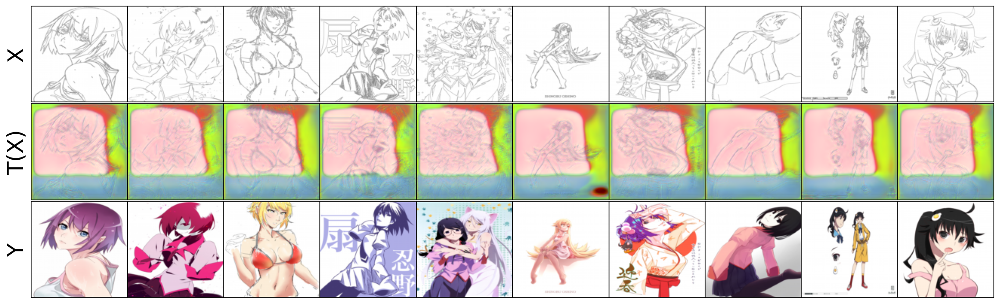

In [ ]:
import gc
import wandb
wandb.login(key = 'f5fa441a3b6fca468e995e9fc93990255e9386dd')
wandb.init(name="BIG_run_fast_L1_loss", project='CV_first_time', entity="marina_shesha")
for step in tqdm(range(MAX_STEPS)):
    # T optimization
    unfreeze(T); freeze(f)
    for t_iter in range(T_ITERS):
        T_opt.zero_grad()
        X = sample_train()[0]
        T_X = T(X)
        if COST == 'mse':
            T_loss = F.mse_loss(X, T_X).mean() - f(T_X).mean()
        elif COST =='L1loss':
            T_loss = F.l1_loss(X, T_X).mean() - f(T_X).mean()
        else:
            raise Exception('Unknown COST')
        T_loss.backward(); T_opt.step()
    del T_loss, T_X, X; gc.collect(); torch.cuda.empty_cache()

    # f optimization
    freeze(T); unfreeze(f)
    X = sample_train()[0]
    with torch.no_grad():
        T_X = T(X)
    Y = sample_train()[1]
    f_opt.zero_grad()
    f_loss = f(T_X).mean() - f(Y).mean()
    f_loss.backward(); f_opt.step();
    wandb.log({f'f_loss' : f_loss.item()}, step=step)
    del f_loss, Y, X, T_X; gc.collect(); torch.cuda.empty_cache()

    if step % PLOT_INTERVAL == 0:
        print('Plotting')
        clear_output(wait=True)
        fig, axes = plot_images(X_test_fixed, Y_test_fixed, T)
        wandb.log({'Fixed Test Images' : [wandb.Image(fig2img(fig))]}, step=step)
        plt.show(fig); plt.close(fig)
    if step % SAVE_CHECKPOINTS_INTERVAL == 0:
        torch.save(T.state_dict(), os.path.join(OUTPUT_PATH, f'T_{SEED}_{step}_fast_L1.pt'))
        torch.save(f.state_dict(), os.path.join(OUTPUT_PATH, f'f_{SEED}_{step}_fast_L1.pt'))
        torch.save(f_opt.state_dict(), os.path.join(OUTPUT_PATH, f'f_opt_{SEED}_{step}_fast_L1.pt'))
        torch.save(T_opt.state_dict(), os.path.join(OUTPUT_PATH, f'T_opt_{SEED}_{step}_fast_L1.pt'))

    gc.collect(); torch.cuda.empty_cache()

print('Plotting')
clear_output(wait=True)
fig, axes = plot_images(X_test_fixed, Y_test_fixed, T)
wandb.log({'Fixed Test Images' : [wandb.Image(fig2img(fig))]}, step=MAX_STEPS+1000)
plt.show(fig); plt.close(fig)
torch.save(T.state_dict(), os.path.join(OUTPUT_PATH, f'T_{SEED}_{MAX_STEPS}_fast_L1.pt'))
torch.save(f.state_dict(), os.path.join(OUTPUT_PATH, f'f_{SEED}_{MAX_STEPS}_fast_L1.pt'))
torch.save(f_opt.state_dict(), os.path.join(OUTPUT_PATH, f'f_opt_{SEED}_{MAX_STEPS}_fast_L1.pt'))
torch.save(T_opt.state_dict(), os.path.join(OUTPUT_PATH, f'T_opt_{SEED}_{MAX_STEPS}_fast_L1.pt'))
gc.collect(); torch.cuda.empty_cache()

In [ ]:
!pip install torchmetrics
!pip install torch-fidelity
!pip install torchmetrics[image]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 12.1 MB/s eta 0:00:00


In [ ]:
T.load_state_dict(torch.load(OUTPUT_PATH+'/T_0_7000_fast.pt'));
T.eval();

In [ ]:
from tqdm import tqdm
from torchmetrics.image.fid import FrechetInceptionDistance
FID = FrechetInceptionDistance(reset_real_features=False).to(DEVICE)
i = 0
for input_image, target_image in tqdm(test_dataloder):
      target_image = target_image.to(DEVICE)
      img = target_image
      i_max = torch.amax(img, dim=[2,3], keepdim=True)
      i_min = torch.amin(img, dim=[2,3], keepdim=True)
      scaled_img = (img - i_min) / (i_max - i_min)
      FID.update((scaled_img * 255).byte(), real=True)
      i += 1

100%|██████████| 1/1 [00:00<00:00, 45.45it/s]


In [ ]:
def plot_images_final(X, Y, T):
    freeze(T);
    with torch.no_grad():
        T_X = T(X)
        #imgs = torch.cat([X, T_X, Y]).to('cpu').permute(0,2,3,1).mul(0.5).add(0.5).numpy().clip(0,1)
        imgs = []
        imgs.append(X.to('cpu'))
        imgs.append(T_X.to('cpu'))
        imgs.append(Y.to('cpu'))

    fig, axes = plt.subplots(3,10, figsize=(15, 4.5), dpi=150)
    for i in range(3):
      for j in range(10):
          axes[i][j].imshow(imgs[i][j].mul(0.5).add(0.5).clip(0,1).permute(1,2,0))
          axes[i][j].get_xaxis().set_visible(False)
          axes[i][j].set_yticks([])

    axes[0, 0].set_ylabel('X', fontsize=24)
    axes[1, 0].set_ylabel('T(X)', fontsize=24)
    axes[2, 0].set_ylabel('Y', fontsize=24)

    fig.tight_layout(pad=0.001)
    torch.cuda.empty_cache(); gc.collect()
    return fig, axes

  0%|          | 0/1 [00:00<?, ?it/s]<ipython-input-66-bfbaf5648959>:20: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  buf = np.fromstring ( fig.canvas.tostring_argb(), dtype=np.uint8 )
<ipython-input-66-bfbaf5648959>:30: DeprecationWarning: tostring() is deprecated. Use tobytes() instead.
  return Image.frombytes( "RGBA", ( w ,h ), buf.tostring( ) )
100%|██████████| 1/1 [00:10<00:00, 10.14s/it]


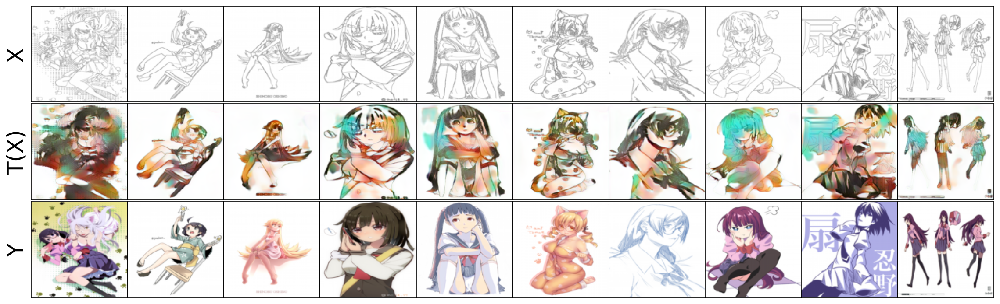

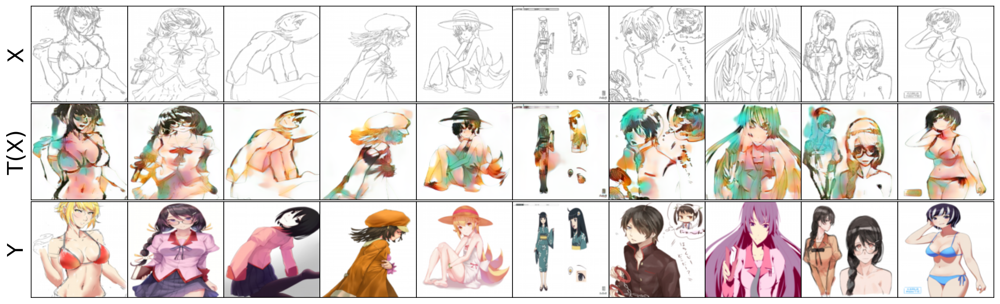

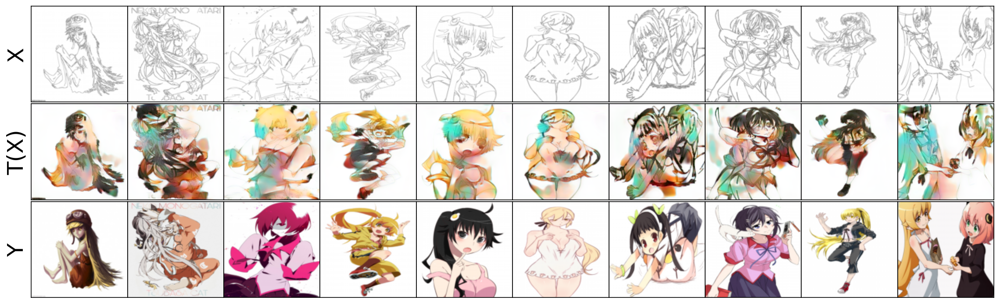

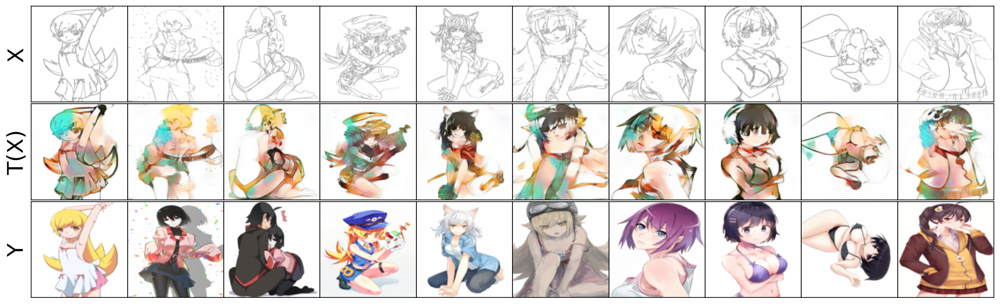

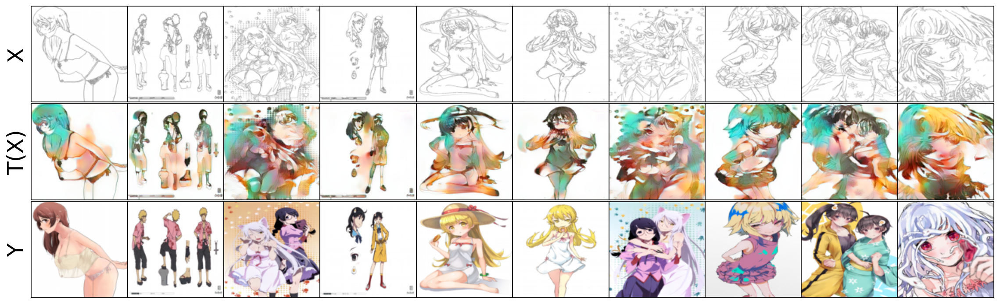

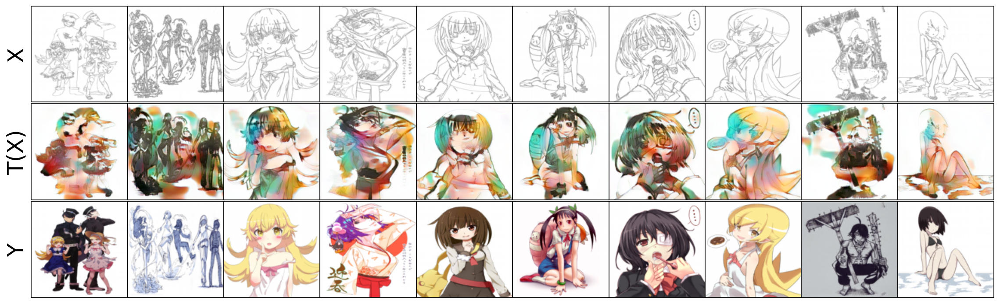

In [ ]:
import wandb
import gc
wandb.init(name="BIG_run_result_new", project='CV_first_time', entity="marina_shesha")
i=0
FID.reset()
with torch.no_grad():
  for input_image, target_image in tqdm(test_dataloder):
        input_image = input_image.to(DEVICE)
        fake_image = T(input_image)
        img = fake_image
        for i in range(6):
          fig, axes = plot_images_final(input_image[i*10:(i+1)*10], target_image[i*10:(i+1)*10], T)
          wandb.log({'Test Images' : [wandb.Image(fig2img(fig))]}, step = i)
        i_max = torch.amax(img, dim=[2,3], keepdim=True)
        i_min = torch.amin(img, dim=[2,3], keepdim=True)
        scaled_img = (img - i_min) / (i_max - i_min)
        FID.update((scaled_img * 255).byte(), real=False)
        i += 1

In [ ]:
FID.compute()

tensor(190.1057, device='cuda:0')